# Midterm Outputs
### Author: Chase Engelhardt 

For this notebook my goal is to create interactive maps on race demographics by neighborhood in the City of LA. additionally I'll be creating interative maps around the housing/jobs imbalance in the City of LA. 

## Import and prep data

In [1]:
#import libraries
import pandas as pd
import geopandas as gpd
import fiona
import geopandas.geoseries  
import folium
import plotly.express as px
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


In [2]:
#import jobs/housing data and race data
df1=pd.read_csv('jobshousing.csv')
df2=pd.read_csv('racetracts.csv')
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 14 columns):
 #   Column                                                   Non-Null Count  Dtype 
---  ------                                                   --------------  ----- 
 0   Unnamed: 0                                               2495 non-null   int64 
 1   CT20                                                     2495 non-null   int64 
 2   geometry                                                 2495 non-null   object
 3   FIPS                                                     2495 non-null   int64 
 4   TotalPop                                                 2495 non-null   int64 
 5   Non Hispanic                                             2495 non-null   int64 
 6   Non Hispanic White Alone                                 2495 non-null   int64 
 7   Non Hispanic Black Alone                                 2495 non-null   int64 
 8   Non Hispanic American Indian and Alask

In [3]:
#Import neighborhood shapes
nhoods=gpd.read_file('data/L.A. Neighborhoods.geojson')
nhoods.head()
nhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [4]:
#join race with nh shapes 
from shapely import wkt
df2['geometry'] = df2['geometry'].apply(wkt.loads)
gdf2 = gpd.GeoDataFrame(df2, crs="EPSG:4326",geometry='geometry')
nhjoin=gdf2.overlay(nhoods, how='intersection')
nhjoin.set_index('name')
nhjoin.drop(nhjoin[nhjoin['type'] != 'segment-of-a-city'].index, inplace = True)

In [5]:
df1['geometry'] = df1['geometry'].apply(wkt.loads)
jh=gpd.GeoDataFrame(df1, crs="EPSG:4326",geometry='geometry')


In [ ]:
#overlay to cut tracts not in the city of LA
zipfile = "data/City_Boundary.zip"
city = geopandas.read_file(zipfile)
racegdf = nhjoin.overlay(city, how='intersection')
racegdf.drop(racegdf[racegdf['type'] != 'segment-of-a-city'].index, inplace = True)
racegdf.sample(10)


In [7]:
#approximate average for race in neighborhoods 
nhrace= nhjoin.dissolve(by='name', aggfunc='sum')
nhrace.head()

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


,geometry,Unnamed: 0,CT20,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,Non Hispanic Native Hawaiian and Pacific Islander Alone,Non Hispanic Other Alone,Non Hispanic Multi Race,Hispanic
name,,,,,,,,,,,,,,
Adams-Normandie,"POLYGON ((-118.30541 34.02571, -118.30890 34.0...",8267,2439227,66409439227,36861,15352,3804,5859,60,4337,34,245,1013,21509
Arleta,"POLYGON ((-118.43579 34.22987, -118.43582 34.2...",2064,1667245,84519667245,56835,17156,8872,757,91,6513,44,202,677,39679
Arlington Heights,"POLYGON ((-118.33381 34.03501, -118.33271 34.0...",9227,2820162,78483820162,43166,21826,4339,5989,69,9858,21,300,1250,21340
Atwater Village,"POLYGON ((-118.27051 34.12151, -118.27331 34.1...",11440,3729825,72447729825,48540,32363,22006,1051,92,7536,43,184,1451,16177
Baldwin Hills/Crenshaw,"POLYGON ((-118.36504 34.00556, -118.36623 34.0...",24408,7467665,126784467665,73917,51807,9726,33070,117,4061,94,734,4005,22110


In [8]:
#create race percentages
racelist=['Non Hispanic White Alone','Non Hispanic Black Alone', 'Non Hispanic American Indian and Alaska Native Alone', 'Non Hispanic Asian Alone', 'Non Hispanic Native Hawaiian and Pacific Islander Alone', 'Non Hispanic Other Alone', 'Non Hispanic Multi Race', 'Hispanic']
for race in racelist:
    nhrace['Percent'+' '+race]=((nhrace[race]/nhrace['TotalPop'])*100)
    
nhrace.info(10)

   

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 114 entries, Adams-Normandie to Woodland Hills
Data columns (total 22 columns):
 #   Column                                                           Non-Null Count  Dtype   
---  ------                                                           --------------  -----   
 0   geometry                                                         114 non-null    geometry
 1   Unnamed: 0                                                       114 non-null    int64   
 2   CT20                                                             114 non-null    int64   
 3   FIPS                                                             114 non-null    int64   
 4   TotalPop                                                         114 non-null    int64   
 5   Non Hispanic                                                     114 non-null    int64   
 6   Non Hispanic White Alone                                         114 non-null    int64   
 7   Non His

In [9]:
#change name to neighborhood
idx=nhrace.index
idx.rename('Neighborhood',inplace=True)
nhrace.sample(10)


,geometry,Unnamed: 0,CT20,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,...,Non Hispanic Multi Race,Hispanic,Percent Non Hispanic White Alone,Percent Non Hispanic Black Alone,Percent Non Hispanic American Indian and Alaska Native Alone,Percent Non Hispanic Asian Alone,Percent Non Hispanic Native Hawaiian and Pacific Islander Alone,Percent Non Hispanic Other Alone,Percent Non Hispanic Multi Race,Percent Hispanic
Neighborhood,,,,,,,,,,,,,,,,,,,,,
Sun Valley,"POLYGON ((-118.40944 34.20381, -118.41380 34.2...",9619,5304247,205263304247,123073,52428,35171,2939,167,11075,...,2265,70645,28.577348,2.388014,0.135692,8.998724,0.087753,0.571206,1.840371,57.400892
Beverly Grove,"POLYGON ((-118.37740 34.06971, -118.37741 34.0...",17608,5590916,90560590916,49835,44780,36034,1661,54,3967,...,2599,5055,72.306612,3.332999,0.108358,7.960269,0.098324,0.834755,5.215210,10.143473
Venice,"MULTIPOLYGON (((-118.45662 33.96499, -118.4619...",28593,8167747,132822167747,85940,72648,56588,3310,148,6524,...,5181,13292,65.845939,3.851524,0.172213,7.591343,0.143123,0.900628,6.028625,15.466605
Larchmont,"POLYGON ((-118.32268 34.07633, -118.32621 34.0...",2455,960660,30185960660,15936,10656,5979,760,14,3068,...,681,5280,37.518825,4.769076,0.087851,19.252008,0.056476,0.909890,4.273343,33.132530
Mission Hills,"POLYGON ((-118.47202 34.25007, -118.47202 34.2...",4724,2635784,84520635784,51231,14406,6931,1377,133,4935,...,749,36825,13.528918,2.687826,0.259608,9.632839,0.142492,0.406004,1.462005,71.880307
Tujunga,"POLYGON ((-118.30859 34.23353, -118.30869 34.2...",10823,5015556,108671015556,64254,50744,39772,810,107,7281,...,2437,13510,61.898092,1.260622,0.166527,11.331590,0.071591,0.452890,3.792760,21.025928
Rancho Park,"POLYGON ((-118.43077 34.02743, -118.43065 34.0...",5907,1622906,36223622906,21883,18650,11691,657,11,4780,...,1342,3233,53.425033,3.002331,0.050267,21.843440,0.141662,0.630627,6.132614,14.774025
Encino,"POLYGON ((-118.50219 34.12995, -118.50238 34.1...",8977,3467056,108669467056,65881,55349,44466,2061,59,4912,...,3410,10532,67.494422,3.128368,0.089555,7.455867,0.066787,0.602602,5.175999,15.986400
Hancock Park,"POLYGON ((-118.34411 34.08027, -118.34411 34.0...",4674,1622225,48297622225,27987,24388,18127,1161,26,3208,...,1506,3599,64.769357,4.148355,0.092900,11.462465,0.053596,1.232715,5.381070,12.859542


## Summary
Now that I have percentages for race, and have everything properly indexed I can create my maps.

## Static Maps 

In [10]:
# Checking the projection of my data
nhrace.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

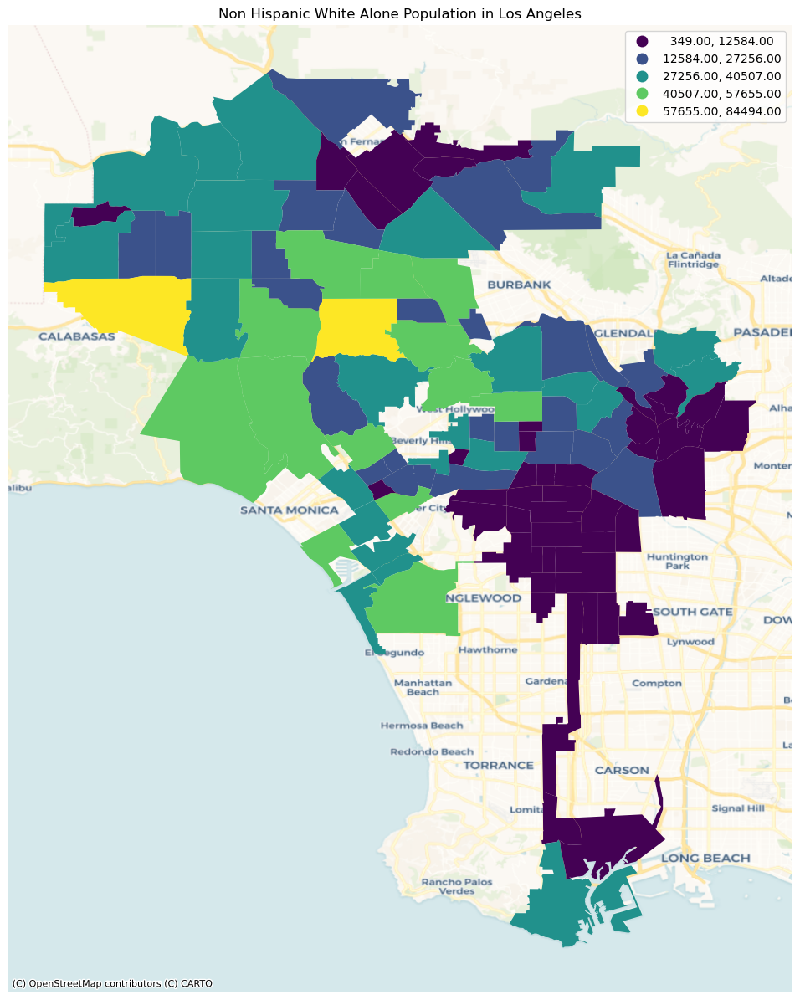

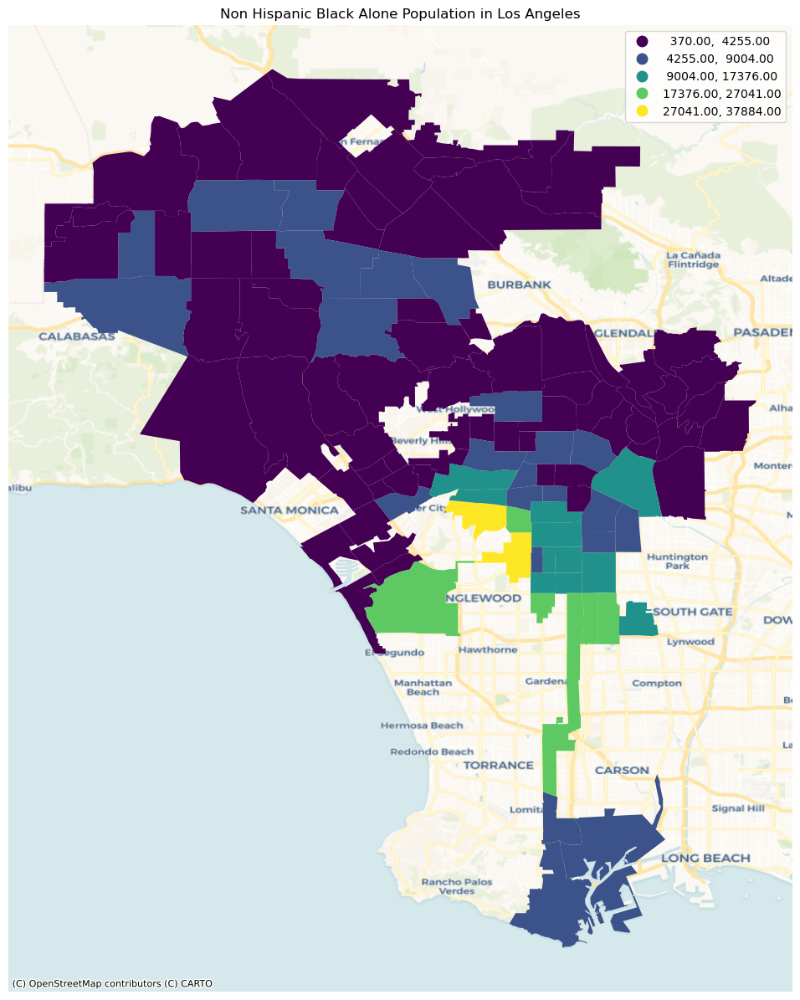

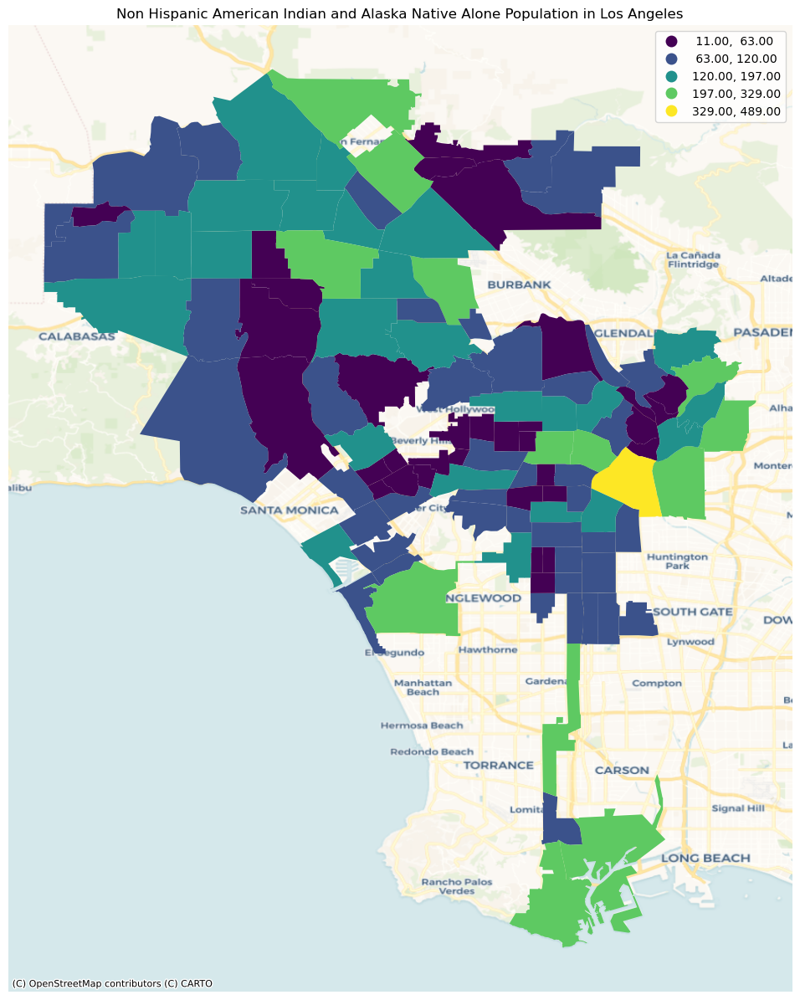

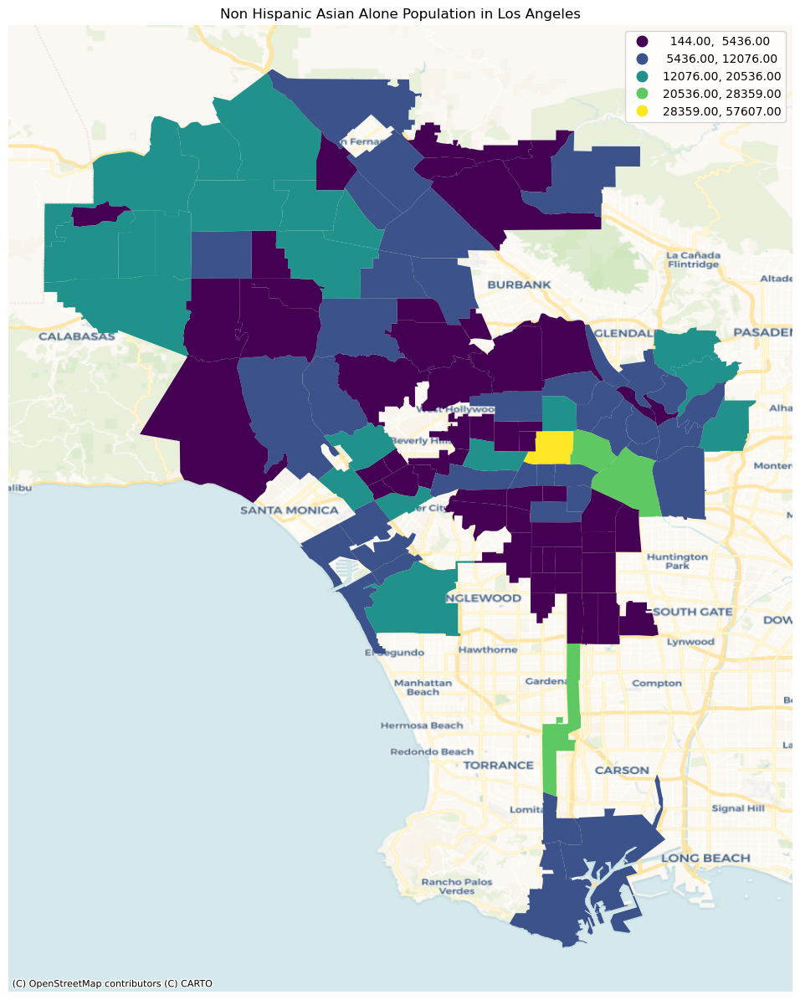

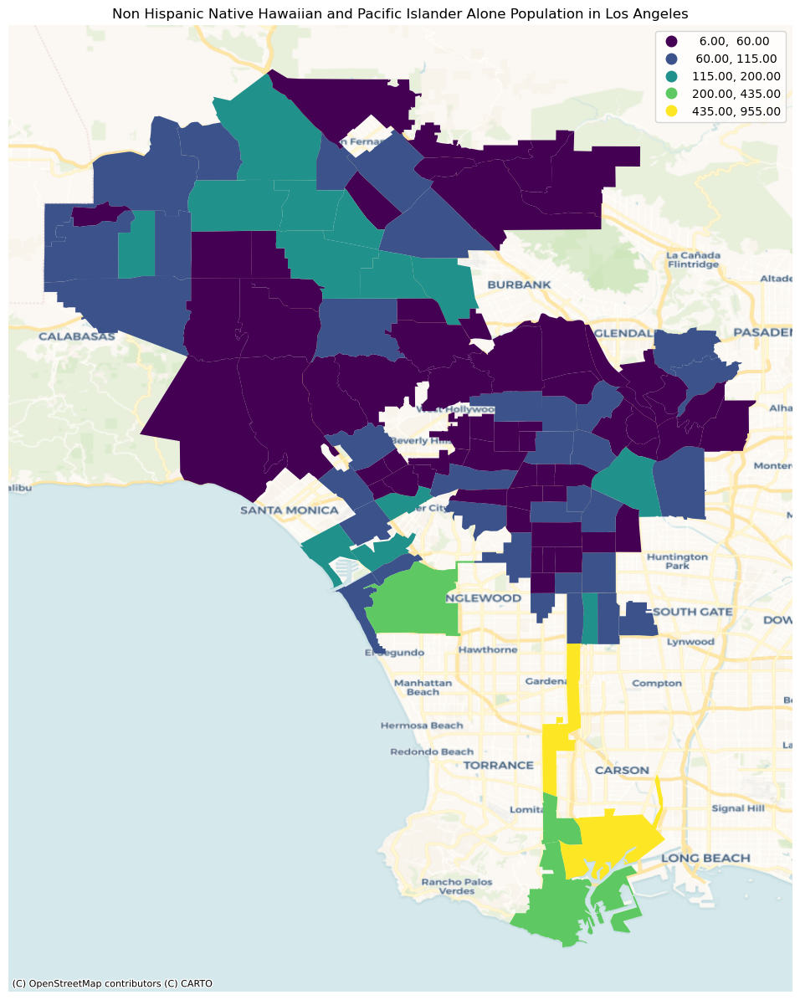

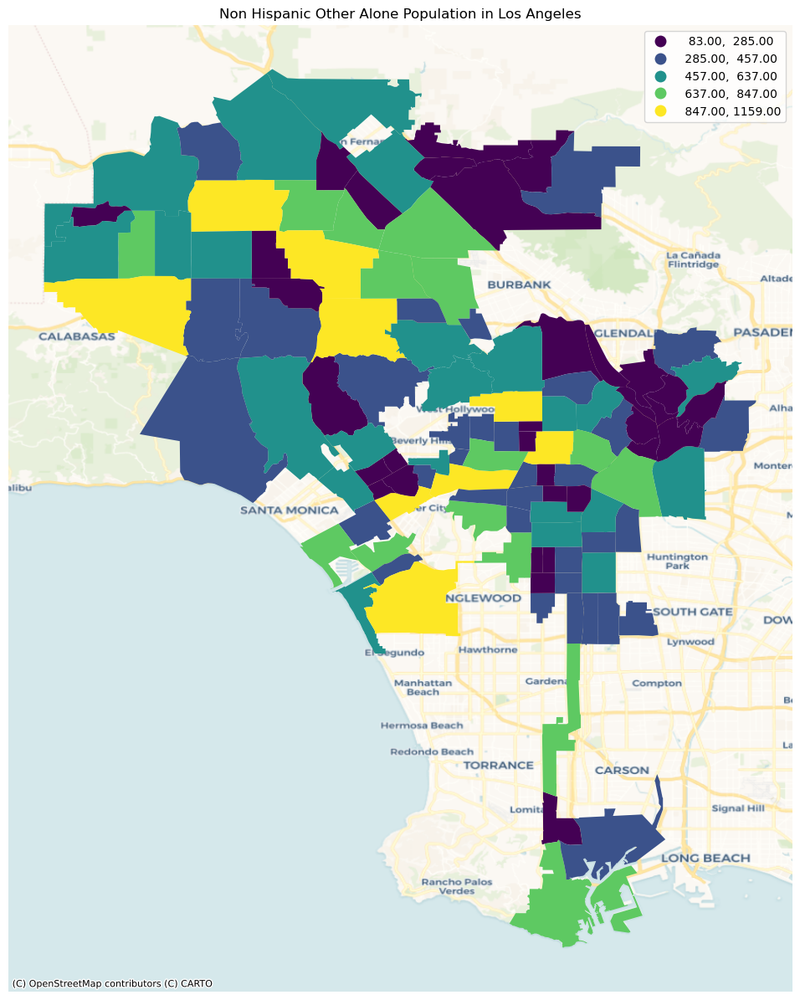

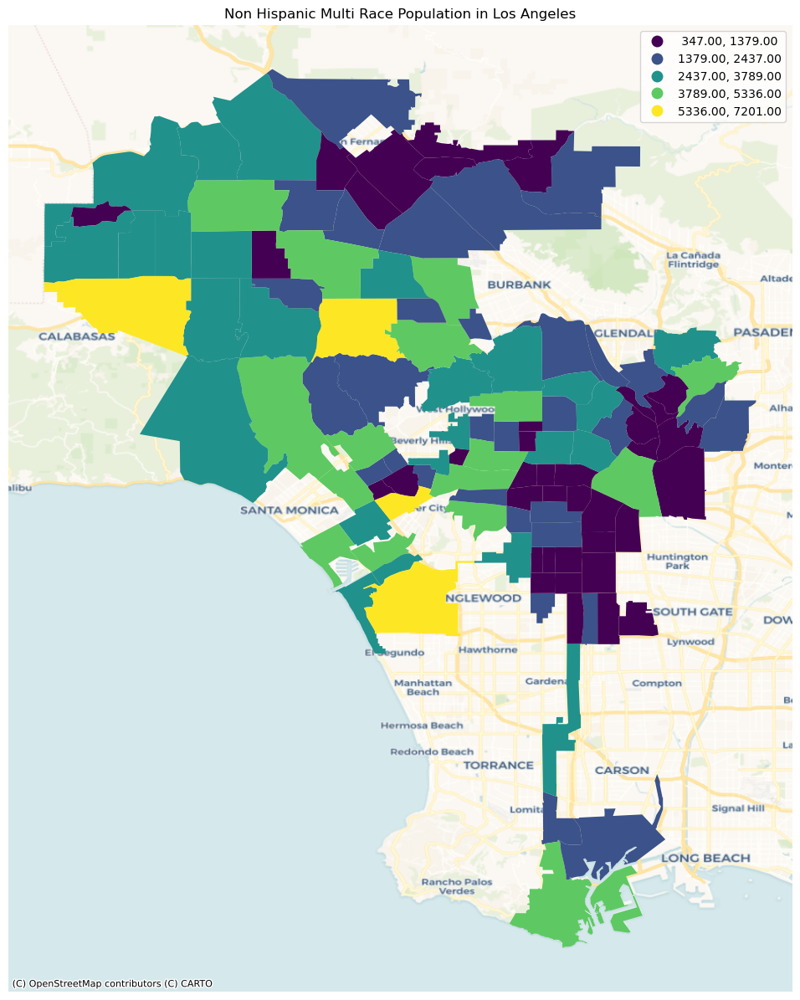

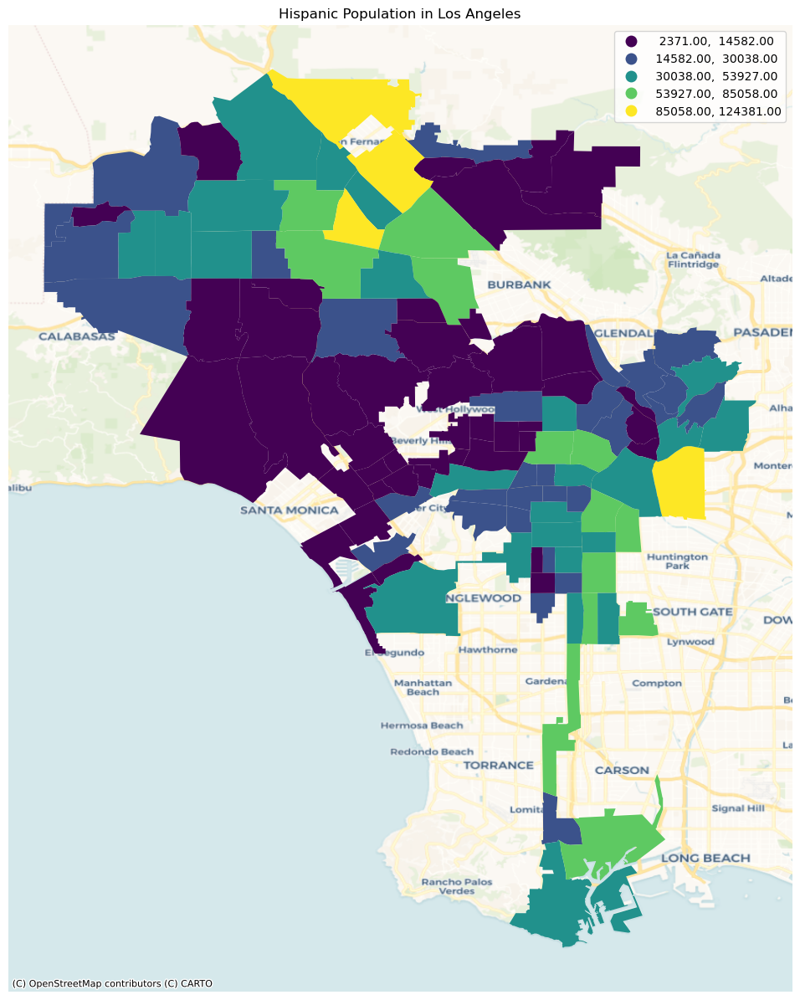

In [11]:
# Creating a loop to plot race by neighborhood
for r in racelist:
    fig, ax = plt.subplots(figsize=(20, 15))
    nhrace.plot(
                 column=r,
                 legend=True, 
                 scheme='naturalbreaks',
                 ax=ax)
    ax.axis('off')

    ax.set_title(r+' '+'Population in Los Angeles')

    ctx.add_basemap(ax,
               crs=4326,
               source=ctx.providers.CartoDB.Voyager
              )





### Results
You can tell how patterns of segregation reinforced by redlining and other racist planning practices have maintained a lot of majority white neighborhoods along the coast and in the Western portions of the Valley. Visualizing patterns like this will help in contextualizing where resources like parks, job access and healthcare facilitites are concentrated. 

## Interactive Maps

In [12]:
#Map of Jobs housing Ratio with housing and jobs layers
m = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

#Quantile layer
folium.Choropleth(
    geo_data=jh,
    name="Number of Jobs Per Unit of Housing",
    data=jh,
    columns=["Neighborhood","Jobs to Housing Quantiles"],
    key_on="feature.properties.Neighborhood",
    fill_color="BuPu",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Jobs to Housing Quantiles",
).add_to(m)
    
#Jobs layer
folium.Choropleth(
    geo_data=jh,
    name="Jobs Per Neighborhood",
    data=jh,
    columns=["Neighborhood","Number of Jobs"],
    key_on="feature.properties.Neighborhood",
    fill_color="PuBuGn",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Jobs Per Neighborhood",
    show=False,

).add_to(m)
    
#Housing layer
folium.Choropleth(
    geo_data=jh,
    name="Housing Units Per Neighborhood",
    data=jh,
    columns=["Neighborhood","Units of Housing"],
    key_on="feature.properties.Neighborhood",
    fill_color="OrRd",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Housing Units Per Neighborhood",
    show=False,

).add_to(m)

folium.LayerControl().add_to(m)

m

In [13]:
m.save("JobsHousingMap.html")

## Results 

We can see that both Westside and more affluent neighborhoods have a lot more jobs than housing compared to the rest of the city. Further below I will make a stacked bar chart to show how racial demographics are correlated with this dynamic. 

In [14]:
#Interactive Race Map
#reanme index in a copy 
nhracemap=nhrace.copy()
nhracemap['nh']=nhrace.index

#loop to plug race into layers
m2 = folium.Map(location=[34.0522, -118.2437], zoom_start=10)
for race in racelist:
    folium.Choropleth(
        geo_data=nhracemap,
        name="Population By Race-"+race,
        data=nhracemap,
        columns=[nhrace.index,race],
        key_on="feature.properties.nh",
        fill_color="PuBuGn",
        fill_opacity=0.9,
        line_opacity=0.2,
        legend_name="Population-"+race,
        show=False
    ).add_to(m2)

    
folium.LayerControl().add_to(m2)
m2

In [15]:
#
m2.save("Racemap.html")

## Results 
This map shows the same data as the static race maps, but allows for a more dynamic comparison of population concentrations of different races of people. 

## Graphing Race in Low-Housing, Job Rich Neighborhoods 

Now I'll merge these dataframes and create a stacked bar chart for a combined analysis. 

In [16]:
#Join race data with jobs/housing data
jh['Merge']=jh['Neighborhood']
nhrace['Merge']=nhrace.index
mergedstats=jh.merge(nhrace, on='Merge')
mergedstats.set_index('Neighborhood')
mergedstats.head()

,Unnamed: 0_x,OBJECTID,CITY,Neighborhood,year_x,Units of Housing,year_y,Number of Jobs,description,set,...,Non Hispanic Multi Race,Hispanic,Percent Non Hispanic White Alone,Percent Non Hispanic Black Alone,Percent Non Hispanic American Indian and Alaska Native Alone,Percent Non Hispanic Asian Alone,Percent Non Hispanic Native Hawaiian and Pacific Islander Alone,Percent Non Hispanic Other Alone,Percent Non Hispanic Multi Race,Percent Hispanic
0,0,1,IN,Pico-Union,2019,13618.70,2019,10516.11,Pico-Union is a neighborhood in the city of Lo...,L.A. County Neighborhoods (Current),...,1040,53440,5.610262,5.060680,0.149039,16.069623,0.055890,0.557566,1.383936,71.113004
1,1,1,IN,Sylmar,2019,22156.30,2019,20444.10,Sylmar is a neighborhood in the city of Los An...,L.A. County Neighborhoods (Current),...,1495,97686,11.473219,2.563106,0.255987,4.875085,0.046175,0.441496,1.211075,79.133858
2,4,1,IN,North Hills,2019,17637.30,2019,9615.66,North Hills is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),...,2389,74826,18.006146,3.862333,0.138028,13.802849,0.117489,0.633452,1.962798,61.476905
3,5,1,IN,Harbor Gateway,2019,13329.57,2019,31028.04,Harbor Gateway is a neighborhood in the city o...,L.A. County Neighborhoods (Current),...,3613,59327,9.379329,17.785689,0.171558,20.631303,0.769194,0.568639,2.910049,47.784239
4,7,1,IN,Lake Balboa,2019,9621.27,2019,10142.76,Lake Balboa is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),...,1379,19212,33.892752,4.014306,0.087539,9.794407,0.050023,0.660297,3.449052,48.051623


In [18]:
#Sort top ten neighborhoods for low housing and plot by race 
sorted2=mergedstats.sort_values(by='Number of Jobs Per Unit of Housing', ascending=False,)
sorted2.drop(columns={'Unnamed: 0_x','OBJECTID', 'CITY','year_x',},inplace=True)
sorted2.info(10)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 110 entries, 88 to 83
Data columns (total 37 columns):
 #   Column                                                           Non-Null Count  Dtype   
---  ------                                                           --------------  -----   
 0   Neighborhood                                                     110 non-null    object  
 1   Units of Housing                                                 110 non-null    float64 
 2   year_y                                                           110 non-null    int64   
 3   Number of Jobs                                                   110 non-null    float64 
 4   description                                                      110 non-null    object  
 5   set                                                              110 non-null    object  
 6   slug                                                             110 non-null    object  
 7   square_miles                       

In [36]:
#dropping non hispanic category to reflect accurate percentages 
raceper2=['Percent Non Hispanic White Alone',
 'Percent Non Hispanic Black Alone',
 'Percent Non Hispanic American Indian and Alaska Native Alone',
 'Percent Non Hispanic Asian Alone',
 'Percent Non Hispanic Native Hawaiian and Pacific Islander Alone',
 'Percent Non Hispanic Other Alone',
 'Percent Non Hispanic Multi Race',
 'Percent Hispanic']

In [35]:
#convert columns to int
for r in raceper2:
    mergedstats = mergedstats.astype({r:'int'})
    
sorted2.head(10)

,Neighborhood,Units of Housing,year_y,Number of Jobs,description,set,slug,square_miles,region,type,...,Non Hispanic Multi Race,Hispanic,Percent Non Hispanic White Alone,Percent Non Hispanic Black Alone,Percent Non Hispanic American Indian and Alaska Native Alone,Percent Non Hispanic Asian Alone,Percent Non Hispanic Native Hawaiian and Pacific Islander Alone,Percent Non Hispanic Other Alone,Percent Non Hispanic Multi Race,Percent Hispanic
88,Century City,3738.48,2019,65122.54,Century City is a neighborhood in the city of ...,L.A. County Neighborhoods (Current),century-city,0.700611,Westside,segment-of-a-city,...,1566,2371,73.810851,1.947222,0.081954,10.395017,0.062285,0.796591,5.133585,7.772496
37,Downtown,36154.32,2019,335257.20,Downtown is a neighborhood in the city of Los ...,L.A. County Neighborhoods (Current),downtown,5.838170,Central L.A.,segment-of-a-city,...,4158,43880,22.253167,13.539823,0.424258,21.204234,0.173521,0.727052,3.607496,38.070449
82,Westchester,17434.97,2019,80734.38,Westchester is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),westchester,10.809212,South Bay,segment-of-a-city,...,7201,38795,33.665766,17.871106,0.183566,10.630165,0.293229,0.804990,5.722346,30.828830
101,Westwood,21145.86,2019,87728.27,Westwood is a neighborhood in the city of Los ...,L.A. County Neighborhoods (Current),westwood,3.675777,Westside,segment-of-a-city,...,3976,9328,57.854353,3.308373,0.198757,22.412120,0.120178,0.732626,4.594513,10.779080
91,West Los Angeles,6318.91,2019,24877.53,West Los Angeles is a neighborhood in the city...,L.A. County Neighborhoods (Current),west-los-angeles,1.049573,Westside,segment-of-a-city,...,2127,2550,66.006276,2.031889,0.120455,16.328019,0.082417,0.605446,6.742321,8.083177
108,Carthay,2766.49,2019,7745.71,Carthay is a neighborhood in the city of Los A...,L.A. County Neighborhoods (Current),carthay,0.504676,Central L.A.,segment-of-a-city,...,1204,3079,60.331767,8.663343,0.182184,8.438009,0.086298,1.764311,5.772366,14.761722
105,Beverly Grove,13138.59,2019,32281.72,Beverly Grove is a neighborhood in the city of...,L.A. County Neighborhoods (Current),beverly-grove,1.648683,Central L.A.,segment-of-a-city,...,2599,5055,72.306612,3.332999,0.108358,7.960269,0.098324,0.834755,5.215210,10.143473
25,Hollywood Hills,13688.68,2019,33623.05,Hollywood Hills is a neighborhood in the city ...,L.A. County Neighborhoods (Current),hollywood-hills,7.047641,Central L.A.,segment-of-a-city,...,3105,8984,62.200121,6.095924,0.200379,8.033531,0.108462,1.137930,5.708035,16.515617
3,Harbor Gateway,13329.57,2019,31028.04,Harbor Gateway is a neighborhood in the city o...,L.A. County Neighborhoods (Current),harbor-gateway,5.140923,Harbor,segment-of-a-city,...,3613,59327,9.379329,17.785689,0.171558,20.631303,0.769194,0.568639,2.910049,47.784239
24,Playa Vista,7065.80,2019,16325.83,Playa Vista is a neighborhood in the city of L...,L.A. County Neighborhoods (Current),playa-vista,1.299292,Westside,segment-of-a-city,...,3789,8857,51.083967,7.421281,0.159247,17.471951,0.199059,0.779949,6.856678,16.027868


In [21]:
 #Stacked plot   
    fig = px.bar(sorted2.head(10),
       x='Neighborhood',
             y=raceper2,
                labels={'Demographic Percentages'})
    #adding titles
    fig.update_layout(
        title='Demographic Breakdown of High Job, Low Housing Neighborhoods',
        yaxis=dict(
            title='Population Percent'))

fig.show()

IndentationError: unexpected indent (2653042033.py, line 2)

In [ ]:
fig.write_html("Racebarchart.html")

## Results 

This bar chart shows us that all of the highest housing/jobs imbalance neighborhoods are predominantly White. The worst offender, Century City is almost 80% White, even though White people are a statistical minority in LA County. 